<a href="https://colab.research.google.com/github/OstermanEric/Image_denoising/blob/main/CSE320_HW_01_Osterman_Eric.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install nibabel -q
!pip install nilearn -q
!pip install scikit-image -q
!pip install scipy -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 32.0 MB/s eta 0:00:00


In [ ]:
# packages used for plotting, manipulating data
import numpy as np
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting
# importing two filters Gaussian, Median
from skimage import filters
from scipy import ndimage
from scipy.ndimage import median_filter
from scipy.ndimage.filters import gaussian_filter
# importing edge detection filter for enhancement
from skimage.filters import sobel


<ipython-input-3-a3297b10e2ff>:10: DeprecationWarning: Please use `gaussian_filter` from the `scipy.ndimage` namespace, the `scipy.ndimage.filters` namespace is deprecated.
  from scipy.ndimage.filters import gaussian_filter


**Reading image data**

In [ ]:
# read .mnc format data

# clean images T1, PD, T2 file path
t1_clean = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t1_clean.mnc')
t2_clean = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t2_clean.mnc')
pd_clean = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/pd_clean.mnc')

# 3% noise file path
t1_3_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t1_3%.mnc')
t2_3_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t2_3%.mnc')
pd_3_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/pd_3%.mnc')

# 9% noise file path
t1_9_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t1_9%.mnc')
t2_9_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/t2_9%.mnc')
pd_9_noise = nib.load('/content/drive/MyDrive/Fall 23/CSE 320/pd_9%.mnc')




In [ ]:
# reading format data

# clean
t1_clean_img = t1_clean.get_fdata()
t1_clean_affine = t1_clean.affine
t2_clean_img = t2_clean.get_fdata()
t2_clean_affine = t2_clean.affine
pd_clean_img = pd_clean.get_fdata()
pd_clean_affine = pd_clean.affine

# 3%
t1_3_img = t1_3_noise.get_fdata()
t1_3_affine = t1_3_noise.affine
t2_3_img = t2_3_noise.get_fdata()
t2_3_affine = t2_3_noise.affine
pd_3_img = pd_3_noise.get_fdata()
pd_3_affine = pd_3_noise.affine

# 9%
t1_9_img = t1_9_noise.get_fdata()
t1_9_affine = t1_9_noise.affine
t2_9_img = t2_9_noise.get_fdata()
t2_9_affine = t2_9_noise.affine
pd_9_img = pd_9_noise.get_fdata()
pd_9_affine = pd_9_noise.affine

**Displaying histogram for t1 clean, 3%, 9% noise**

Displaying histogram:


Text(0.5, 1.0, 't1_9%_noise')

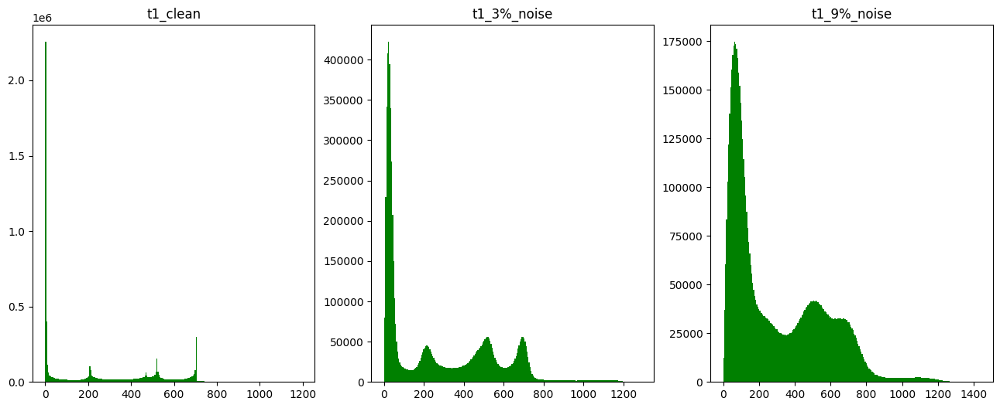

In [ ]:
print('Displaying histogram:')
# by using this size we can effectively see the axis and titles clearly
fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(16,6), facecolor='white')

ax0.hist(t1_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax0.set_title('t1_clean')

ax1.hist(t1_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax1.set_title('t1_3%_noise')

ax2.hist(t1_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax2.set_title('t1_9%_noise')

**Displaying histogram for t2 clean, 3%, 9% noise**

Displaying histogram:


Text(0.5, 1.0, 't2_9%_noise')

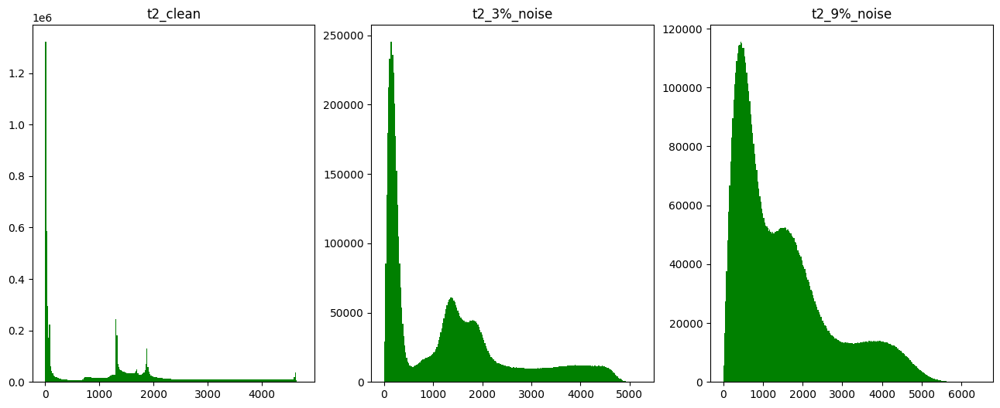

In [ ]:
print('Displaying histogram:')
# by using this size we can effectively see the axis and titles clearly
fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(16,6), facecolor='white')

ax0.hist(t2_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax0.set_title('t2_clean')

ax1.hist(t2_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax1.set_title('t2_3%_noise')

ax2.hist(t2_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax2.set_title('t2_9%_noise')


**Displaying histogram for pd clean, 3%, 9% noise**

Displaying histogram:


Text(0.5, 1.0, 'pd_9%_noise')

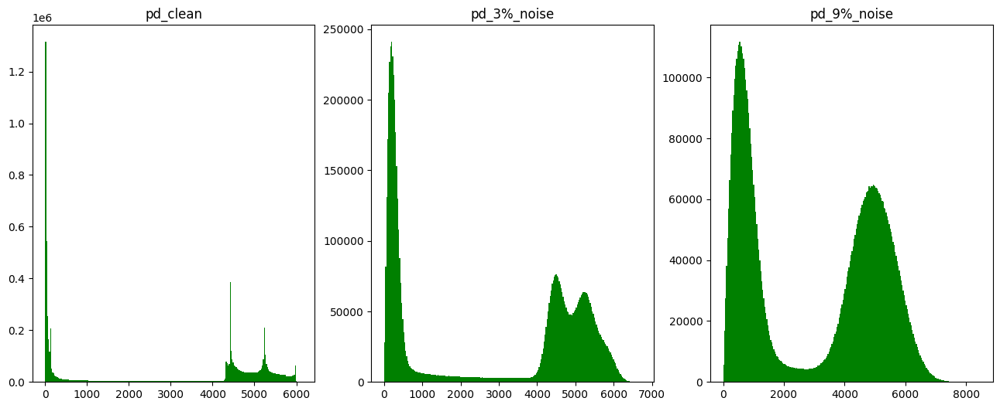

In [ ]:
print('Displaying histogram:')
# by using this size we can effectively see the axis and titles clearly
fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(16,6), facecolor='white')

ax0.hist(pd_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax0.set_title('pd_clean')

ax1.hist(pd_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax1.set_title('pd_3%_noise')

ax2.hist(pd_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax2.set_title('pd_9%_noise')

**Image denoising**

Here, we will use 2 different methods to show the denoising process


1.   Gaussian filtering
2.   Median filtering

Chose these filters to demonstrate differences between a linear and non-linear filter methods

In [ ]:
# Gaussian filtering
# decided to use a sigma value of 0.5. Experimented with other values but found this value worked better overall
# will discuss why this value was chose more in depth in report
t1_3_img_gaussian = gaussian_filter(t1_3_img, sigma = 0.5)
t1_9_img_gaussian = gaussian_filter(t1_9_img, sigma = 0.5)
t2_3_img_gaussian = gaussian_filter(t2_3_img, sigma = 0.5)
t2_9_img_gaussian = gaussian_filter(t2_9_img, sigma = 0.5)
pd_3_img_gaussian = gaussian_filter(pd_3_img, sigma = 0.5)
pd_9_img_gaussian = gaussian_filter(pd_9_img, sigma = 0.5)

# Median filtering
t1_3_img_median = median_filter(t1_3_img, 3)
t1_9_img_median = median_filter(t1_9_img, 3)
t2_3_img_median = median_filter(t2_3_img, 3)
t2_9_img_median = median_filter(t2_9_img, 3)
pd_3_img_median = median_filter(pd_3_img, 3)
pd_9_img_median = median_filter(pd_9_img, 3)

**Visualizing t1 3% & 9% noise compared to original clean image after smoothing**





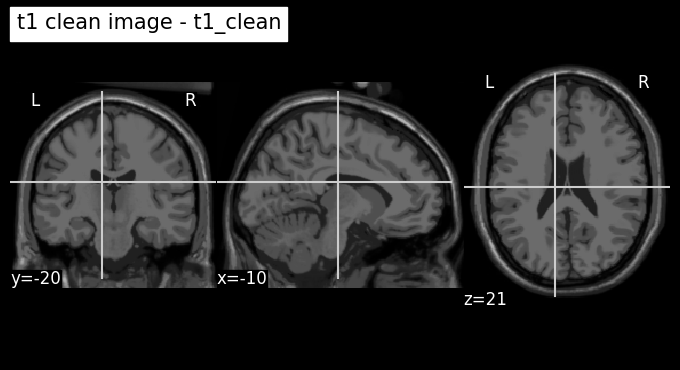

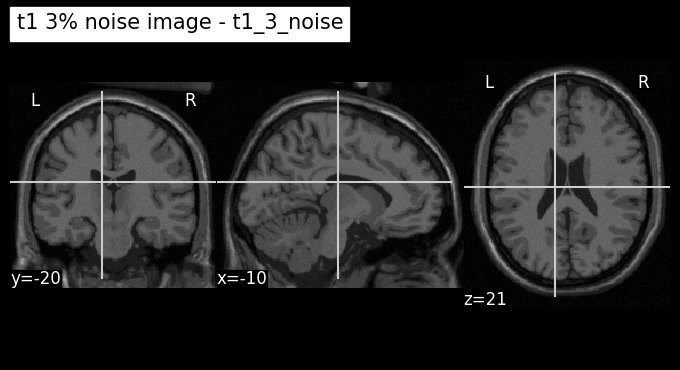

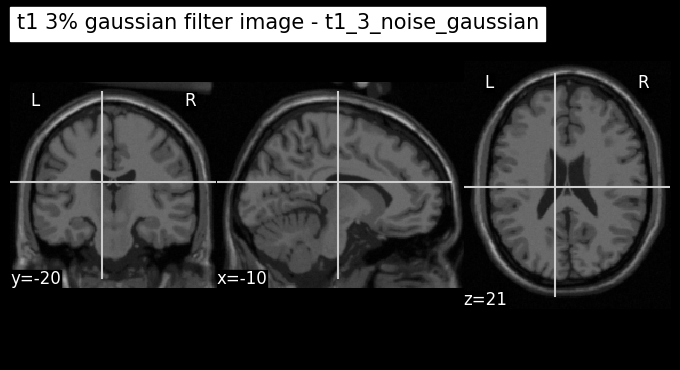

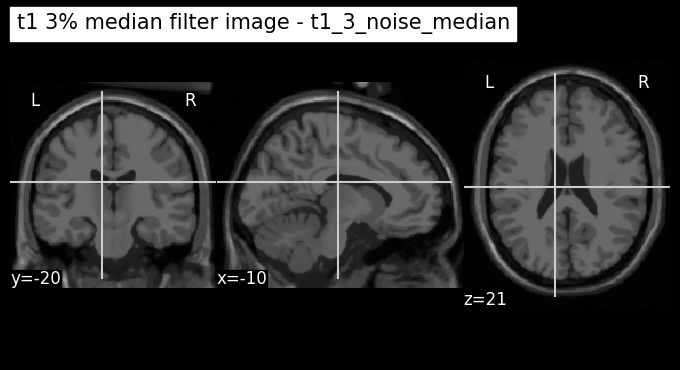

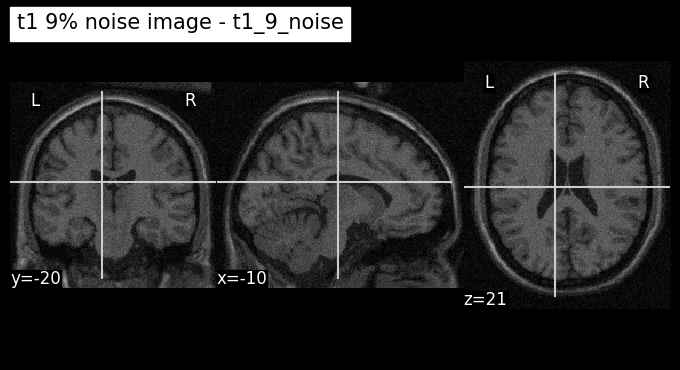

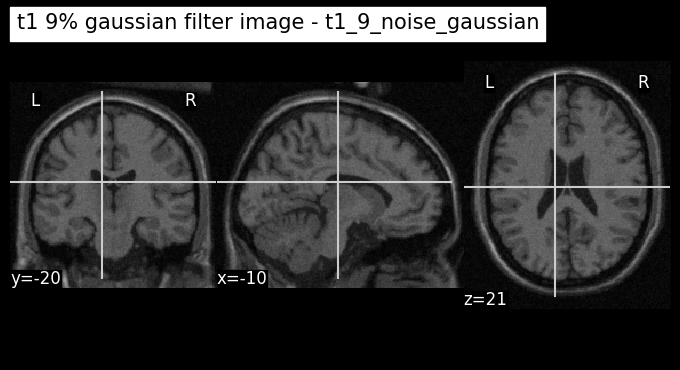

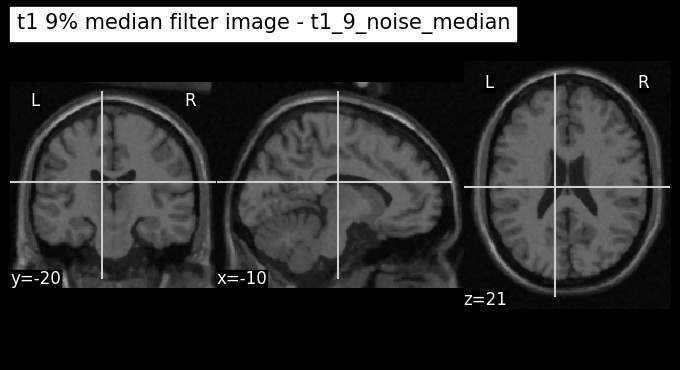

In [ ]:
# showing oriignal images for t1 before smoothing
# ensuring that coordinates are same that each image can be compared correctly
display = plotting.plot_anat(t1_clean, title = "t1 clean image - t1_clean", cut_coords=[-10, -20, 21], threshold=None)

# 3%
display = plotting.plot_anat(t1_3_noise, title = "t1 3% noise image - t1_3_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
t1_3_noise_gaussian_nii = nib.Nifti1Image(t1_3_img_gaussian, t1_3_affine)
display = plotting.plot_anat(t1_3_noise_gaussian_nii, title = "t1 3% gaussian filter image - t1_3_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
# median smoothing applied
t1_3_noise_median_nii = nib.Nifti1Image(t1_3_img_median, t1_3_affine)
display = plotting.plot_anat(t1_3_noise_median_nii, title = "t1 3% median filter image - t1_3_noise_median", cut_coords=[-10, -20, 21], threshold=None)

# 9%
display = plotting.plot_anat(t1_9_noise, title = "t1 9% noise image - t1_9_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
t1_9_noise_gaussian_nii = nib.Nifti1Image(t1_9_img_gaussian, t1_9_affine)
display = plotting.plot_anat(t1_9_noise_gaussian_nii, title = "t1 9% gaussian filter image - t1_9_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
#median smoothing applied
t1_9_noise_median_nii = nib.Nifti1Image(t1_9_img_median, t1_9_affine)
display = plotting.plot_anat(t1_9_noise_median_nii, title = "t1 9% median filter image - t1_9_noise_median", cut_coords=[-10, -20, 21], threshold=None)

**Visualizing t2 3% & 9% noise compared to original clean image after filtering**

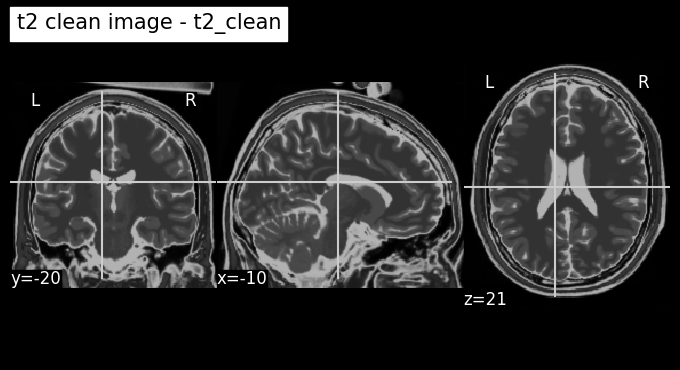

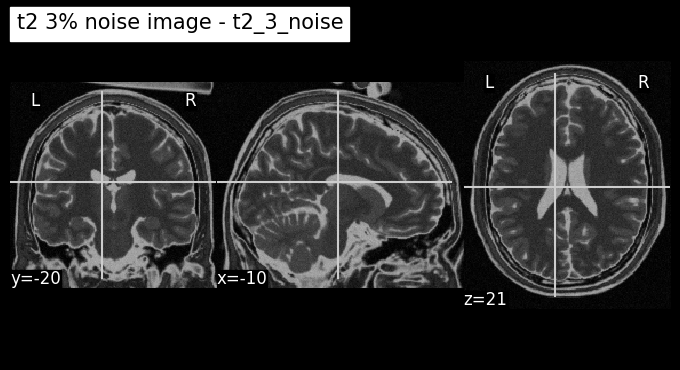

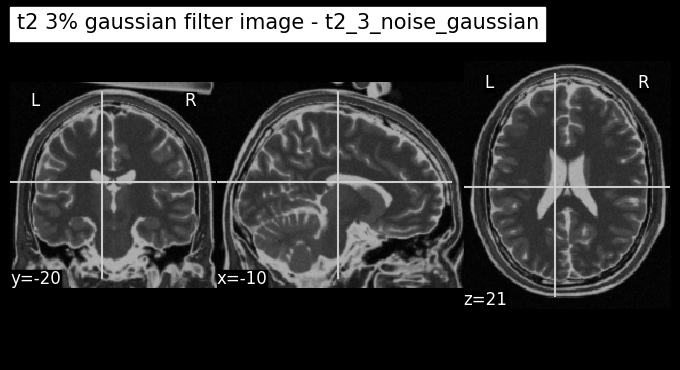

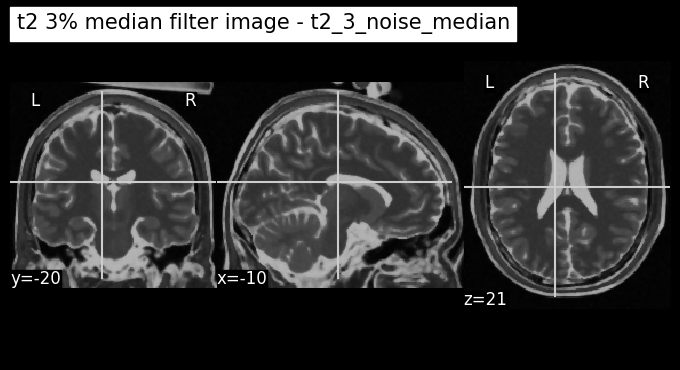

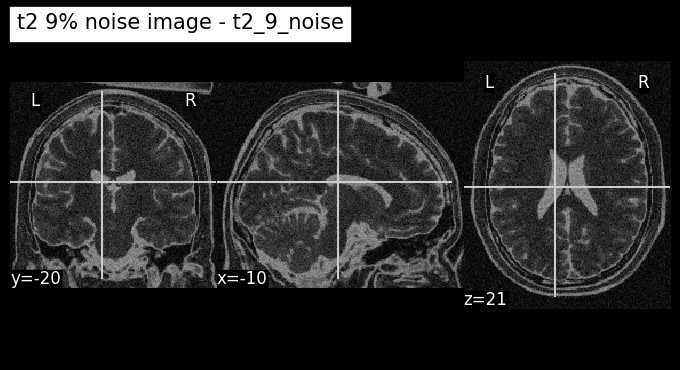

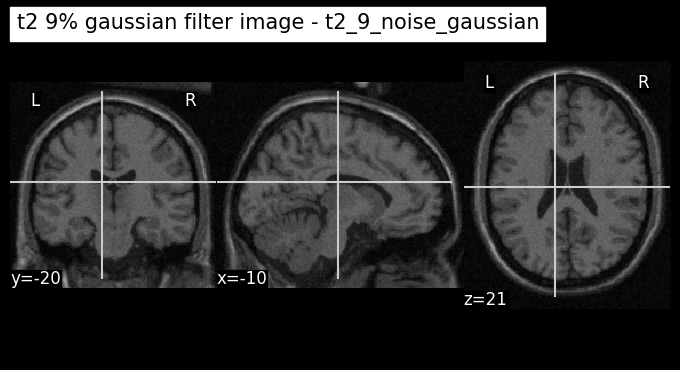

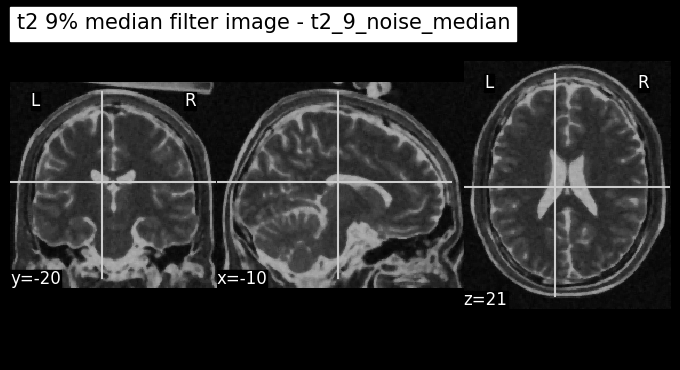

In [ ]:
# showing oriignal images for t2 before smoothing
# ensuring that coordinates are same that each image can be compared correctly
display = plotting.plot_anat(t2_clean, title = "t2 clean image - t2_clean", cut_coords=[-10, -20, 21], threshold=None)
# 3%
display = plotting.plot_anat(t2_3_noise, title = "t2 3% noise image - t2_3_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
t2_3_noise_gaussian_nii = nib.Nifti1Image(t2_3_img_gaussian, t2_3_affine)
display = plotting.plot_anat(t2_3_noise_gaussian_nii, title = "t2 3% gaussian filter image - t2_3_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
# median smoothing applied
t2_3_noise_median_nii = nib.Nifti1Image(t2_3_img_median, t2_3_affine)
display = plotting.plot_anat(t2_3_noise_median_nii, title = "t2 3% median filter image - t2_3_noise_median", cut_coords=[-10, -20, 21], threshold=None)


# 9%
display = plotting.plot_anat(t2_9_noise, title = "t2 9% noise image - t2_9_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
t2_9_noise_gaussian_nii = nib.Nifti1Image(t1_9_img_gaussian, t1_9_affine)
display = plotting.plot_anat(t2_9_noise_gaussian_nii, title = "t2 9% gaussian filter image - t2_9_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
# median smoothing applied
t2_9_noise_median_nii = nib.Nifti1Image(t2_9_img_median, t2_9_affine)
display = plotting.plot_anat(t2_9_noise_median_nii, title = "t2 9% median filter image - t2_9_noise_median", cut_coords=[-10, -20, 21], threshold=None)

**Visualizing pd 3% & 9% noise compared to original clean image after filtering**

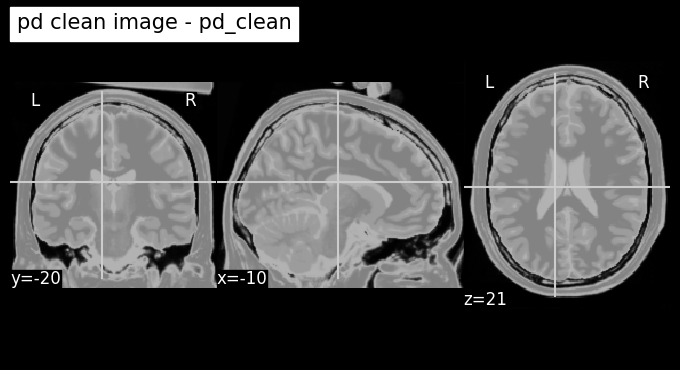

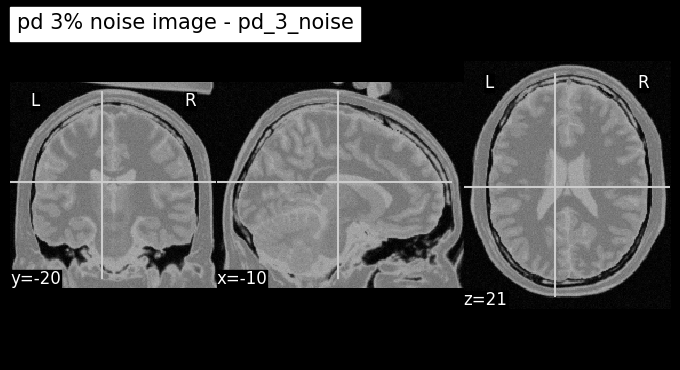

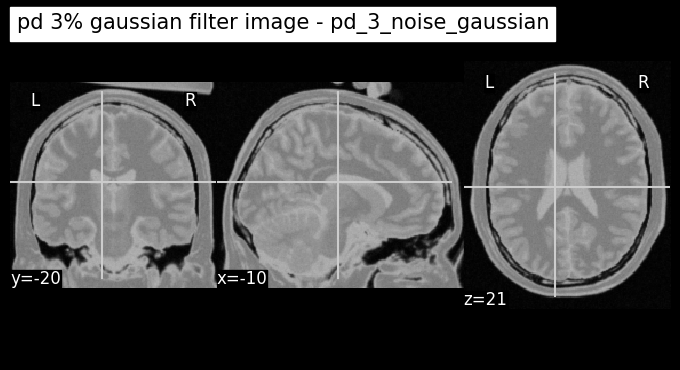

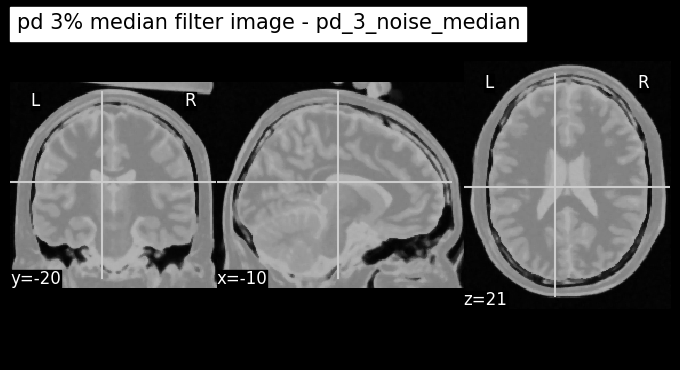

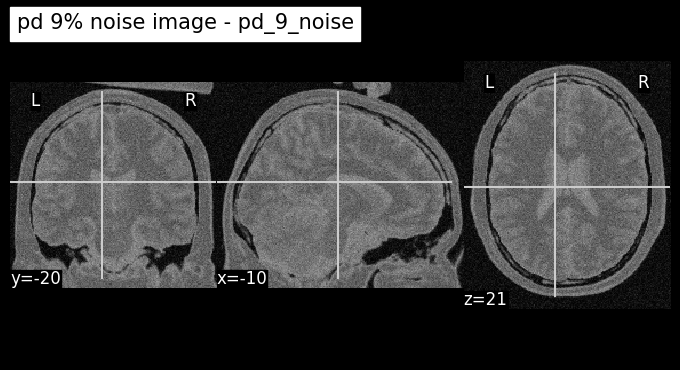

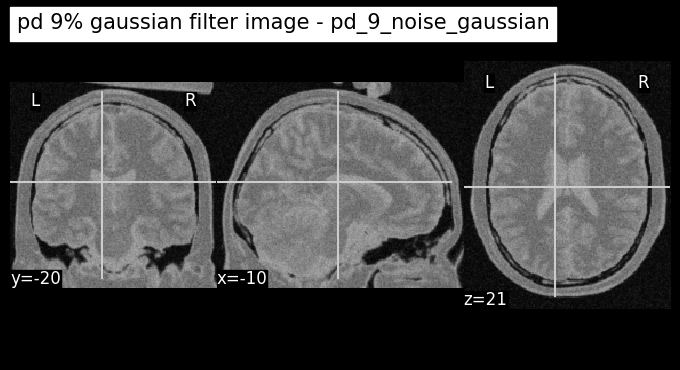

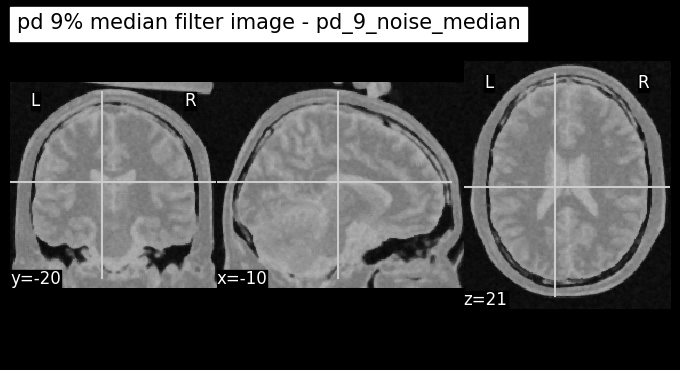

In [ ]:
# showing oriignal images for pd before smoothing
# ensuring that coordinates are same that each image can be compared correctly
display = plotting.plot_anat(pd_clean, title = "pd clean image - pd_clean", cut_coords=[-10, -20, 21], threshold=None)
# 3%
display = plotting.plot_anat(pd_3_noise, title = "pd 3% noise image - pd_3_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
pd_3_noise_gaussian_nii = nib.Nifti1Image(pd_3_img_gaussian, pd_3_affine)
display = plotting.plot_anat(pd_3_noise_gaussian_nii, title = "pd 3% gaussian filter image - pd_3_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
# median smoothing applied
pd_3_noise_median_nii = nib.Nifti1Image(pd_3_img_median, pd_3_affine)
display = plotting.plot_anat(pd_3_noise_median_nii, title = "pd 3% median filter image - pd_3_noise_median", cut_coords=[-10, -20, 21], threshold=None)


# 9%
display = plotting.plot_anat(pd_9_noise, title = "pd 9% noise image - pd_9_noise", cut_coords=[-10, -20, 21], threshold=None)
# gaussian smoothing applied
pd_9_noise_gaussian_nii = nib.Nifti1Image(pd_9_img_gaussian, pd_9_affine)
display = plotting.plot_anat(pd_9_noise_gaussian_nii, title = "pd 9% gaussian filter image - pd_9_noise_gaussian", cut_coords=[-10, -20, 21], threshold=None)
# median smoothing applied
pd_9_noise_median_nii = nib.Nifti1Image(pd_9_img_median, pd_9_affine)
display = plotting.plot_anat(pd_9_noise_median_nii, title = "pd 9% median filter image - pd_9_noise_median", cut_coords=[-10, -20, 21], threshold=None)

**Histograms showing t1 denoised images compared to clean and noised images**

Displaying histogram:


Text(0.5, 1.0, 't1_9%_noise_median_filter')

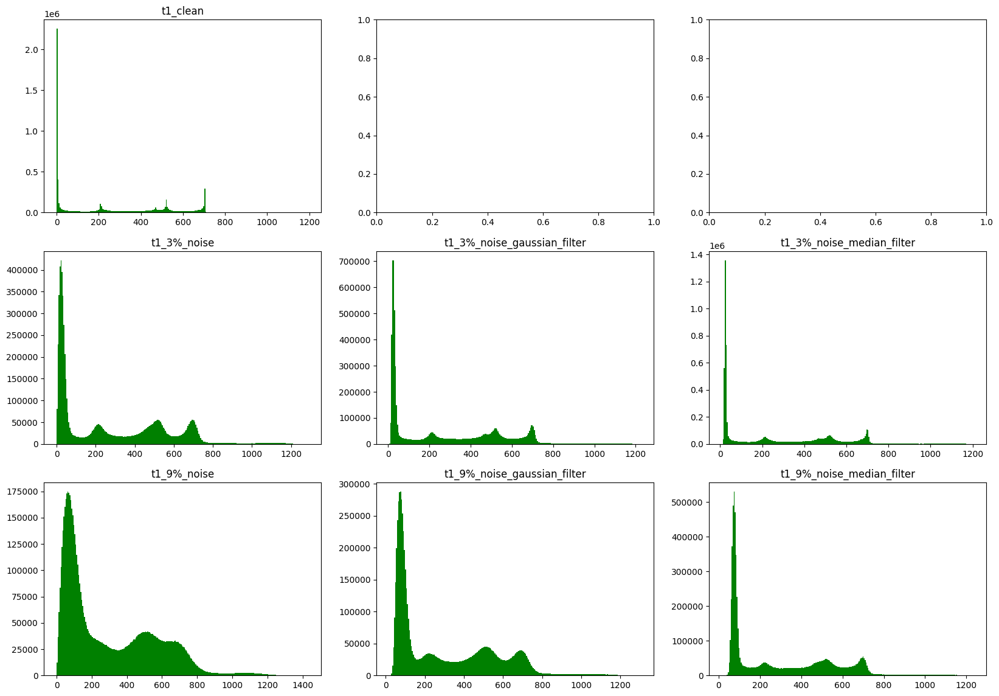

In [ ]:
print('Displaying histogram:')

fig, ax_arr = plt.subplots(nrows = 3, ncols = 3, figsize=(20, 14), facecolor = 'white')
# plotting original t1 clean and noised images
ax_arr[0,0].hist(t1_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[0,0].set_title('t1_clean')
ax_arr[1,0].hist(t1_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,0].set_title('t1_3%_noise')
ax_arr[2,0].hist(t1_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,0].set_title('t1_9%_noise')

# plotting gaussian & median for t1 3% noise images after smoothing
ax_arr[1,1].hist(t1_3_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,1].set_title('t1_3%_noise_gaussian_filter')
ax_arr[1,2].hist(t1_3_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,2].set_title('t1_3%_noise_median_filter')

# plotting gaussian & median for t1 9% noise images after smoothing
ax_arr[2,1].hist(t1_9_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,1].set_title('t1_9%_noise_gaussian_filter')
ax_arr[2,2].hist(t1_9_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,2].set_title('t1_9%_noise_median_filter')

**Histograms showing t2 denoised images compared to clean and noised images**

Displaying histogram:


Text(0.5, 1.0, 't2_9%_noise_median_filter')

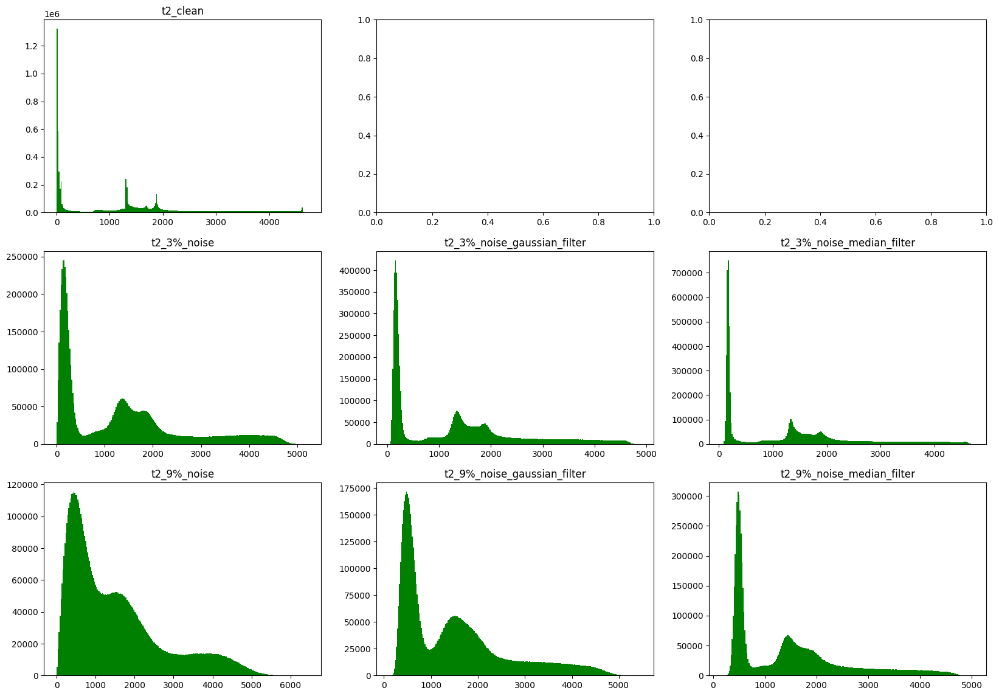

In [ ]:
print('Displaying histogram:')

fig, ax_arr = plt.subplots(nrows = 3, ncols = 3, figsize=(20, 14), facecolor = 'white')
# plotting t2 original clean and noised images
ax_arr[0,0].hist(t2_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[0,0].set_title('t2_clean')
ax_arr[1,0].hist(t2_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,0].set_title('t2_3%_noise')
ax_arr[2,0].hist(t2_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,0].set_title('t2_9%_noise')

# plotting gaussian & median for t2 3% noise images after smoothing
ax_arr[1,1].hist(t2_3_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,1].set_title('t2_3%_noise_gaussian_filter')
ax_arr[1,2].hist(t2_3_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,2].set_title('t2_3%_noise_median_filter')

# plotting gaussian & median for t2 9% noise images after smoothing
ax_arr[2,1].hist(t2_9_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,1].set_title('t2_9%_noise_gaussian_filter')
ax_arr[2,2].hist(t2_9_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,2].set_title('t2_9%_noise_median_filter')

Histograms showing pd denoised images compared to clean and noised images

Displaying histogram:


Text(0.5, 1.0, 'pd_9%_noise_median_filter')

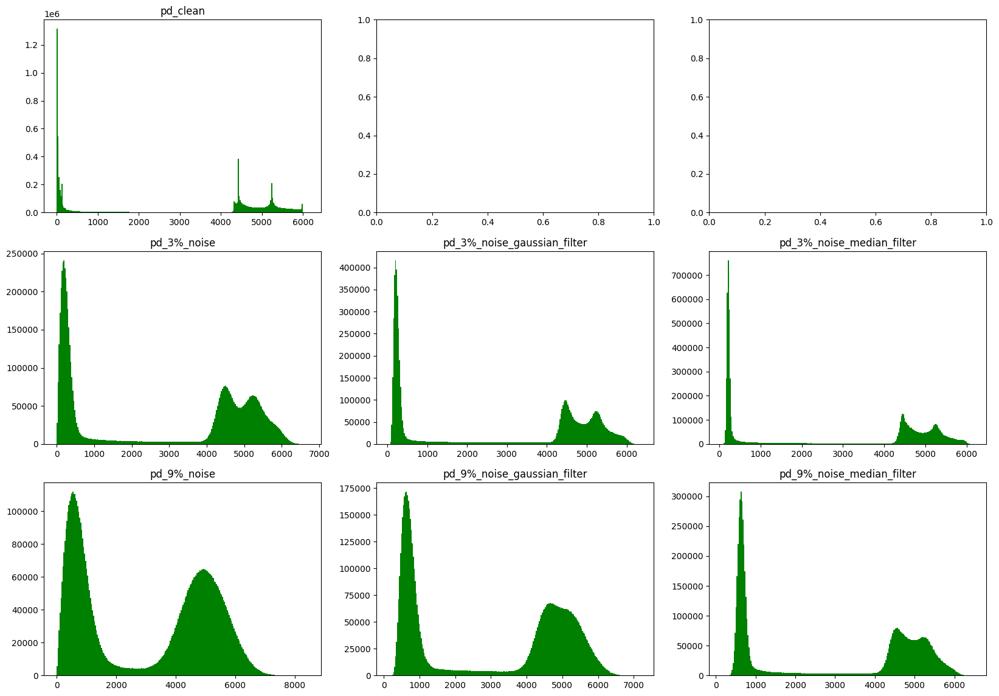

In [ ]:
print('Displaying histogram:')

fig, ax_arr = plt.subplots(nrows = 3, ncols = 3, figsize=(20, 14), facecolor = 'white')
# plotting original pd clean and noised images
ax_arr[0,0].hist(pd_clean_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[0,0].set_title('pd_clean')
ax_arr[1,0].hist(pd_3_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,0].set_title('pd_3%_noise')
ax_arr[2,0].hist(pd_9_img.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,0].set_title('pd_9%_noise')

# plotting gaussian & median for pd 3% images after smoothing
ax_arr[1,1].hist(pd_3_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,1].set_title('pd_3%_noise_gaussian_filter')
ax_arr[1,2].hist(pd_3_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[1,2].set_title('pd_3%_noise_median_filter')

# plotting gaussian & median for pd 9% images after smoothing
ax_arr[2,1].hist(pd_9_img_gaussian.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,1].set_title('pd_9%_noise_gaussian_filter')
ax_arr[2,2].hist(pd_9_img_median.ravel(), bins=256, facecolor='g', alpha=1)
ax_arr[2,2].set_title('pd_9%_noise_median_filter')

**Results Analysis**

Using the images and hisograms above we can arrive at a few conclusions:


1.   Both Gaussian and Median smoothing methods reduce noise and appear to
     smooth our variability. CV analysis will provide more quantifiable analysis on this.
2.   The Gaussian filter tends to generally be noiseier compared to
     the Median filter.
3.   While the Median filter is less noisy than the Gaussian filter,
     it tends to have higher 'peaks' as shown in the hisogram.



**Edge Enhancement**

Processing in the correct consecutive order, it is wise to enhance the edges after filtering.

I will be using sobel edge enhanement for this. The goal is to enhance the edges in the smoothed images to further enhance them and reduce noise and improve quality.

In [ ]:
# initalizing for t1_3
edge_sobel_t1_3 = np.zeros((t1_3_img.shape[0], t1_3_img.shape[1], t1_3_img.shape[2]), dtype=float)
 # edge extraction for t_3_noise
 # by using :, we can perform this extraction for each value in matrix
for idx in range(t1_3_img.shape[2]):
  edge_sobel_t1_3[:,:,idx] = sobel(t1_3_img[:,:,idx])
# enhanced t1 3% filtering
enhanced_t1_3_img_median = edge_sobel_t1_3 + t1_3_img_median
enhanced_t1_3_img_gaussian = edge_sobel_t1_3 + t1_3_img_gaussian

# initalizing for t1_9
edge_sobel_t1_9 = np.zeros((t1_9_img.shape[0], t1_9_img.shape[1], t1_9_img.shape[2]), dtype=float)
# edge extraction for t_9_noise
# by using :, we can perform this extraction for each value in matrix
for idx in range(t1_9_img.shape[2]):
  edge_sobel_t1_9[:,:,idx] = sobel(t1_9_img[:,:,idx])
# enhanced t1 9% filtering
enhanced_t1_9_img_median = edge_sobel_t1_9 + t1_9_img_median
enhanced_t1_9_img_gaussian = edge_sobel_t1_9 + t1_9_img_gaussian


# initalizing for t2_3
edge_sobel_t2_3 = np.zeros((t2_3_img.shape[0], t2_3_img.shape[1], t2_3_img.shape[2]), dtype=float)

# edge extraction for t2_3_noise
# by using :, we can perform this extraction for each value in matrix
for idx in range(t2_3_img.shape[2]):
  edge_sobel_t2_3[:,:,idx] = sobel(t2_3_img[:,:,idx])
# enhanced t2 3% filtering
enhanced_t2_3_img_median = edge_sobel_t2_3 + t2_3_img_median
enhanced_t2_3_img_gaussian = edge_sobel_t2_3 + t2_3_img_gaussian

# initalizing for t2_9
edge_sobel_t2_9 = np.zeros((t2_9_img.shape[0], t2_9_img.shape[1], t2_9_img.shape[2]), dtype=float)
# edge extraction for t2_9_noise
# by using :, we can perform this extraction for each value in matrix
for idx in range(t2_9_img.shape[2]):
  edge_sobel_t2_9[:,:,idx] = sobel(t2_9_img[:,:,idx])
# enhanced t2 9% filtering
enhanced_t2_9_img_median = edge_sobel_t2_9 + t2_9_img_median
enhanced_t2_9_img_gaussian = edge_sobel_t2_9 + t2_9_img_gaussian


# initalizing for pd_3
edge_sobel_pd_3 = np.zeros((pd_3_img.shape[0], pd_3_img.shape[1], pd_3_img.shape[2]), dtype=float)

# edge extraction for pd_3_noise
# by using :, we can perform this extraction for each value in matrix
for idx in range(pd_3_img.shape[2]):
  edge_sobel_pd_3[:,:,idx] = sobel(pd_3_img[:,:,idx])
# enhanced pd 3% filtering
enhanced_pd_3_img_median = edge_sobel_pd_3 + pd_3_img_median
enhanced_pd_3_img_gaussian = edge_sobel_pd_3 + pd_3_img_gaussian

# initalizing for pd_9
edge_sobel_pd_9 = np.zeros((pd_9_img.shape[0], pd_9_img.shape[1], pd_9_img.shape[2]), dtype=float)
# edge extraction for pd_9_noise
# by using :, we can perform this extraction for each value in matrix
for idx in range(pd_9_img.shape[2]):
  edge_sobel_pd_9[:,:,idx] = sobel(pd_9_img[:,:,idx])
# enhanced pd 9% filtering
enhanced_pd_9_img_median = edge_sobel_pd_9 + pd_9_img_median
enhanced_pd_9_img_gaussian = edge_sobel_pd_9 + pd_9_img_gaussian

**Displaying t1 3% & 9% edge enhancement with Gaussian & Median filters**

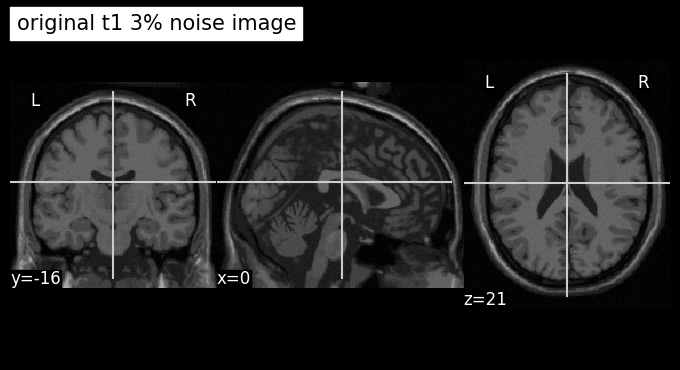

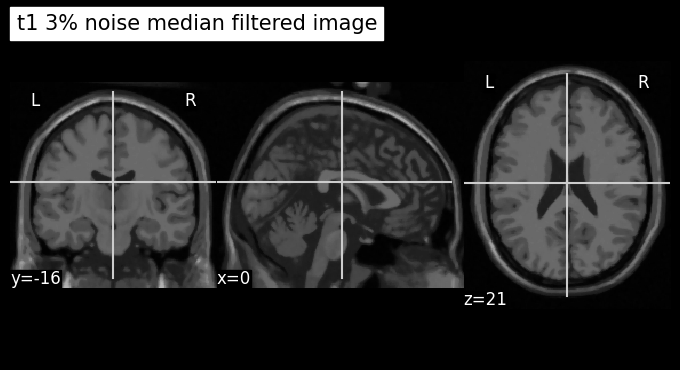

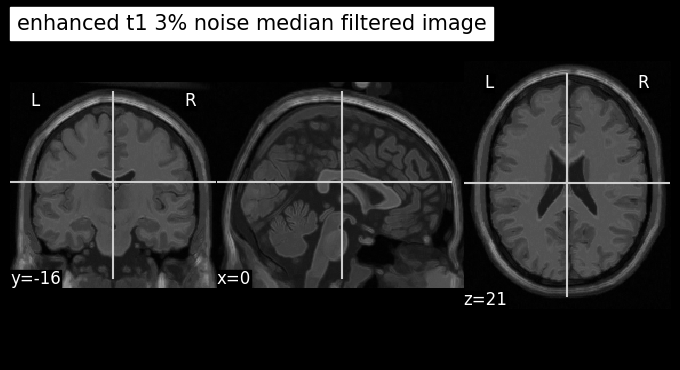

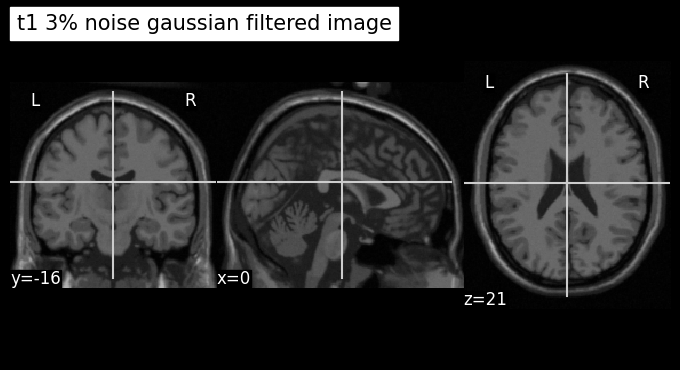

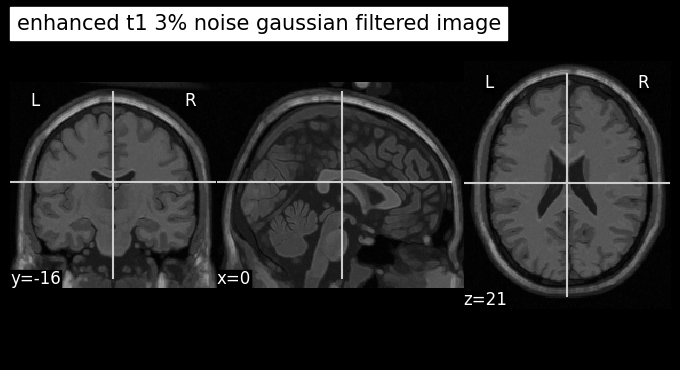

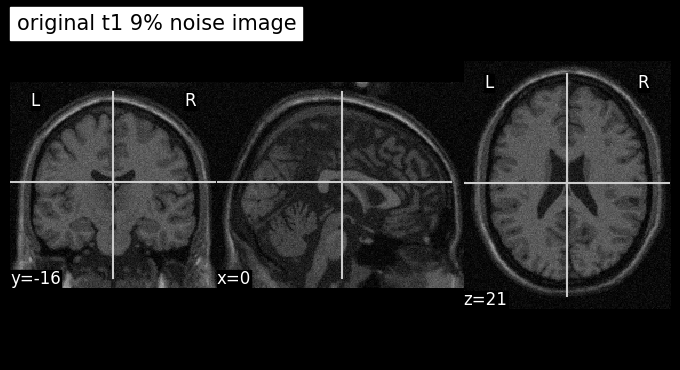

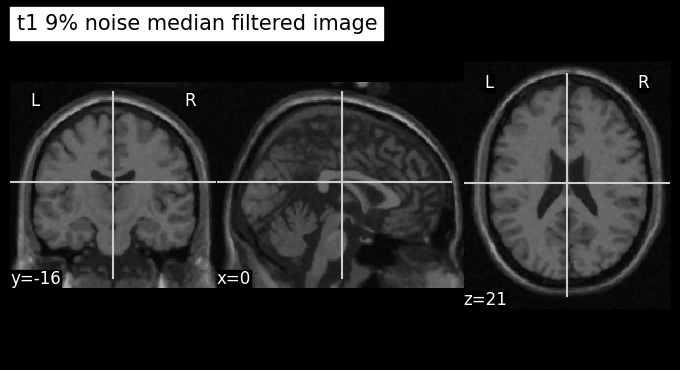

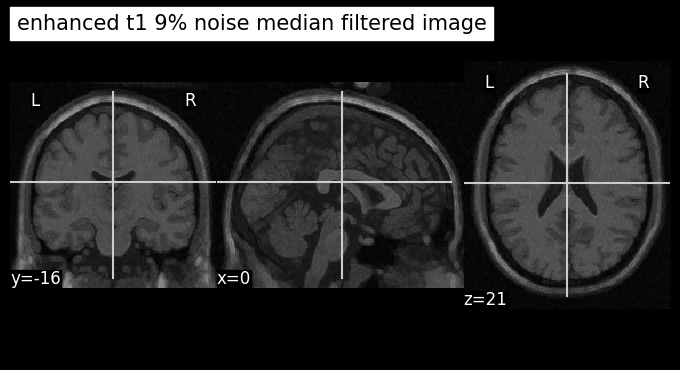

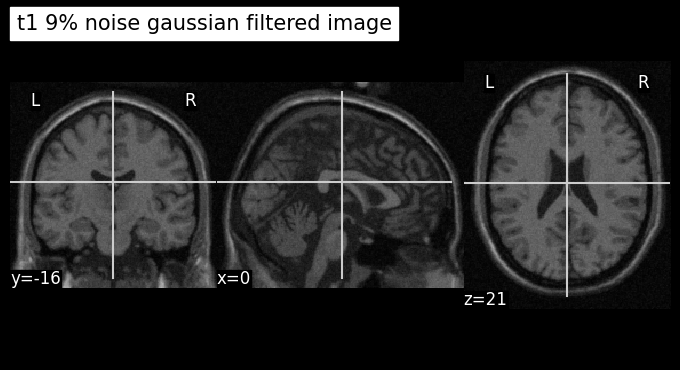

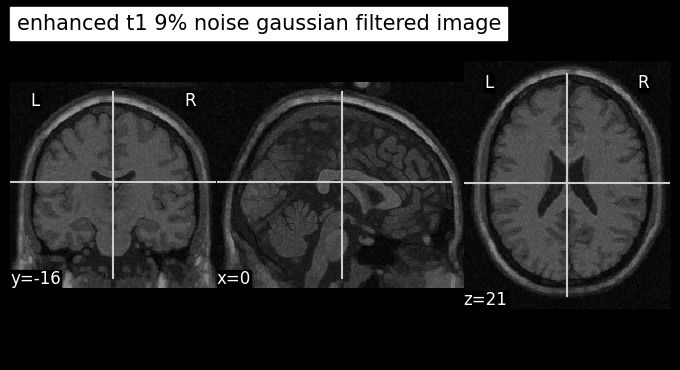

In [ ]:
# original 3% noise image t1
display = plotting.plot_anat(t1_3_noise, title="original t1 3% noise image", cut_coords=[0,-16,21])

# median denoised image 3%
display = plotting.plot_anat(t1_3_noise_median_nii, title="t1 3% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median image
enhanced_t1_3_img_median_nii = nib.Nifti1Image(enhanced_t1_3_img_median, t1_3_affine)
display = plotting.plot_anat(enhanced_t1_3_img_median_nii, title="enhanced t1 3% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 3%
display = plotting.plot_anat(t1_3_noise_gaussian_nii, title="t1 3% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_t1_3_img_gaussian_nii = nib.Nifti1Image(enhanced_t1_3_img_gaussian, t1_3_affine)
display = plotting.plot_anat(enhanced_t1_3_img_gaussian_nii, title="enhanced t1 3% noise gaussian filtered image", cut_coords=[0,-16,21])

# original 9% noise image
display = plotting.plot_anat(t1_9_noise, title="original t1 9% noise image", cut_coords=[0,-16,21])

# median denoised image 9%
display = plotting.plot_anat(t1_9_noise_median_nii, title="t1 9% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median images
enhanced_t1_9_img_median_nii = nib.Nifti1Image(enhanced_t1_9_img_median, t1_9_affine)
display = plotting.plot_anat(enhanced_t1_9_img_median_nii, title="enhanced t1 9% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 9%
display = plotting.plot_anat(t1_9_noise_gaussian_nii, title="t1 9% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_t1_9_img_gaussian_nii = nib.Nifti1Image(enhanced_t1_9_img_gaussian, t1_9_affine)
display = plotting.plot_anat(enhanced_t1_9_img_gaussian_nii, title="enhanced t1 9% noise gaussian filtered image", cut_coords=[0,-16,21])


**Displaying t2 3% & 9% edge enhancement with Gaussian & Median filters**

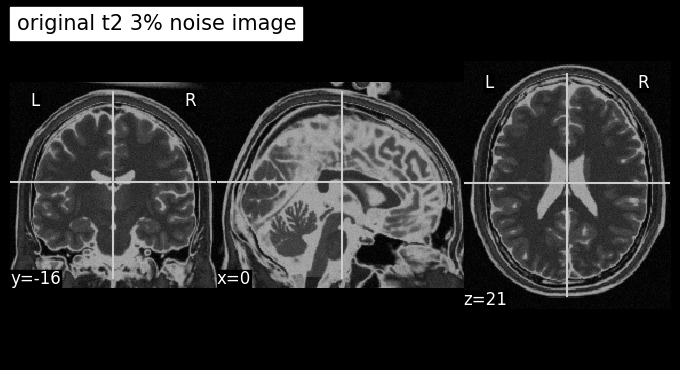

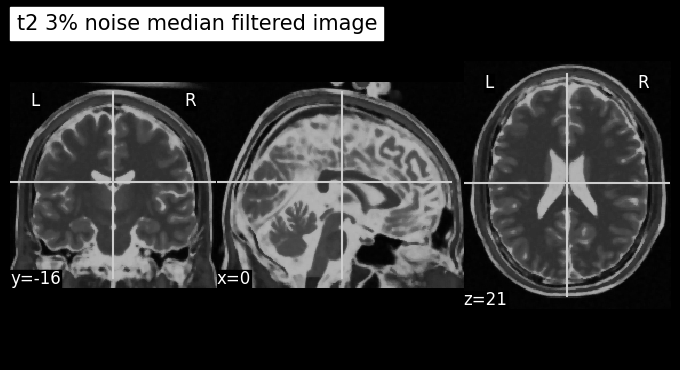

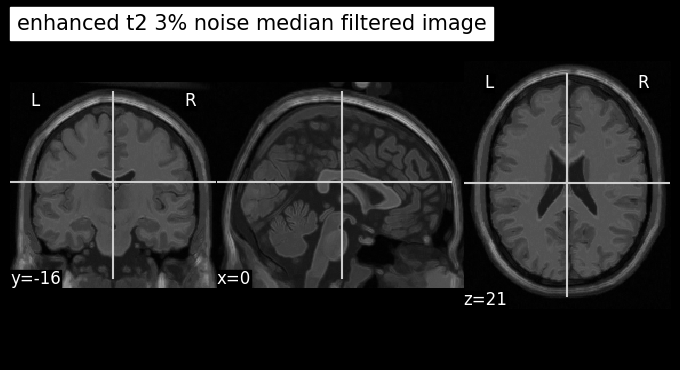

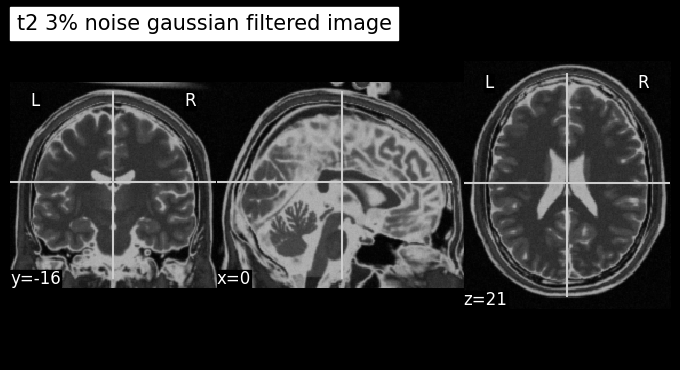

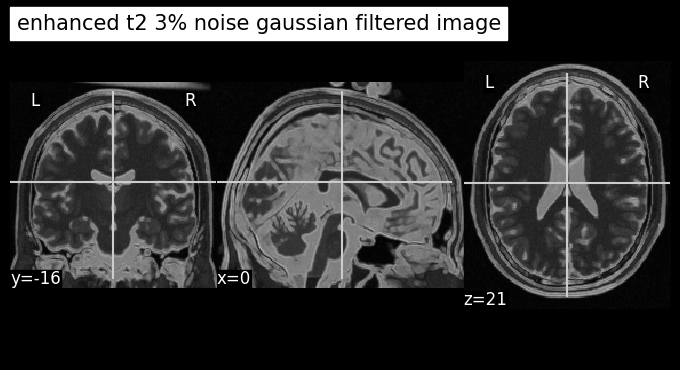

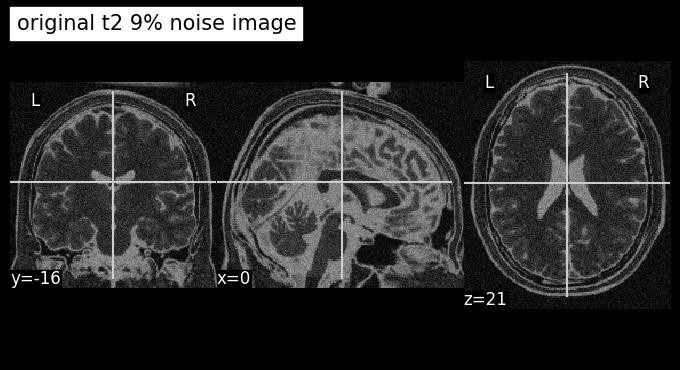

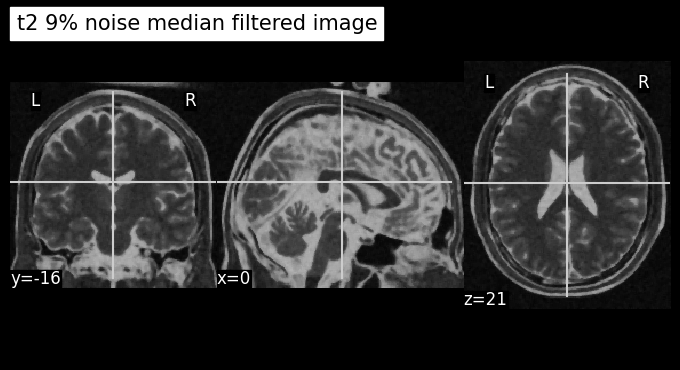

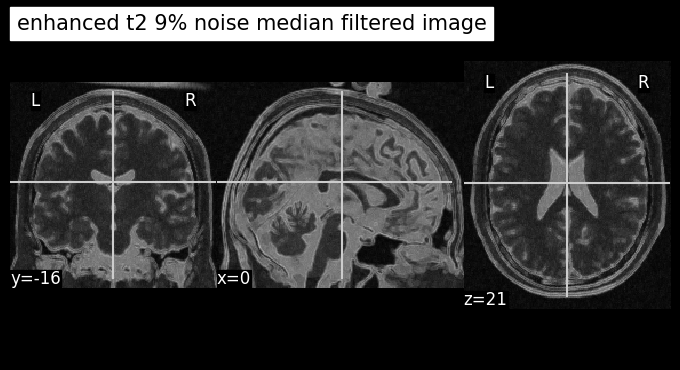

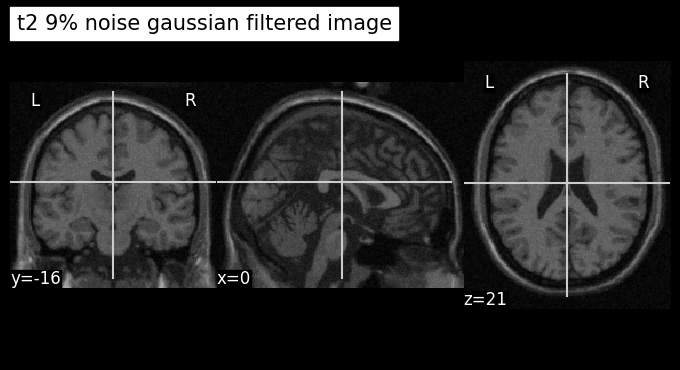

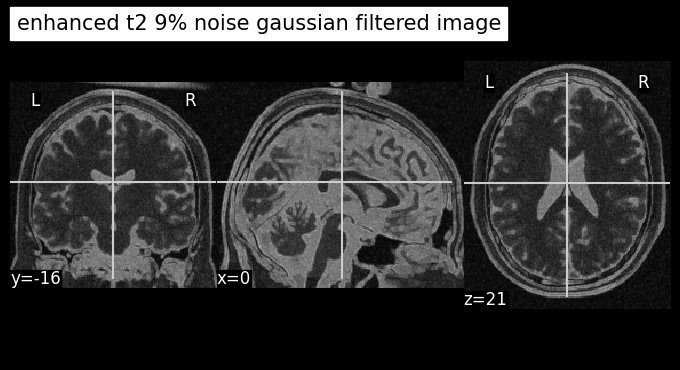

In [ ]:
# original 3% noise image t2
display = plotting.plot_anat(t2_3_noise, title="original t2 3% noise image", cut_coords=[0,-16,21])

# median denoised image 3%
display = plotting.plot_anat(t2_3_noise_median_nii, title="t2 3% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median image
enhanced_t2_3_img_median_nii = nib.Nifti1Image(enhanced_t2_3_img_median, t2_3_affine)
display = plotting.plot_anat(enhanced_t1_3_img_median_nii, title="enhanced t2 3% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 3%
display = plotting.plot_anat(t2_3_noise_gaussian_nii, title="t2 3% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_t2_3_img_gaussian_nii = nib.Nifti1Image(enhanced_t2_3_img_gaussian, t2_3_affine)
display = plotting.plot_anat(enhanced_t2_3_img_gaussian_nii, title="enhanced t2 3% noise gaussian filtered image", cut_coords=[0,-16,21])

# original 9% noise image
display = plotting.plot_anat(t2_9_noise, title="original t2 9% noise image", cut_coords=[0,-16,21])

# median denoised image 9%
display = plotting.plot_anat(t2_9_noise_median_nii, title="t2 9% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median images
enhanced_t2_9_img_median_nii = nib.Nifti1Image(enhanced_t2_9_img_median, t2_9_affine)
display = plotting.plot_anat(enhanced_t2_9_img_median_nii, title="enhanced t2 9% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 9%
display = plotting.plot_anat(t2_9_noise_gaussian_nii, title="t2 9% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_t2_9_img_gaussian_nii = nib.Nifti1Image(enhanced_t2_9_img_gaussian, t2_9_affine)
display = plotting.plot_anat(enhanced_t2_9_img_gaussian_nii, title="enhanced t2 9% noise gaussian filtered image", cut_coords=[0,-16,21])

**Displaying pd 3% & 9% edge enhancement with Gaussian & Median filters**

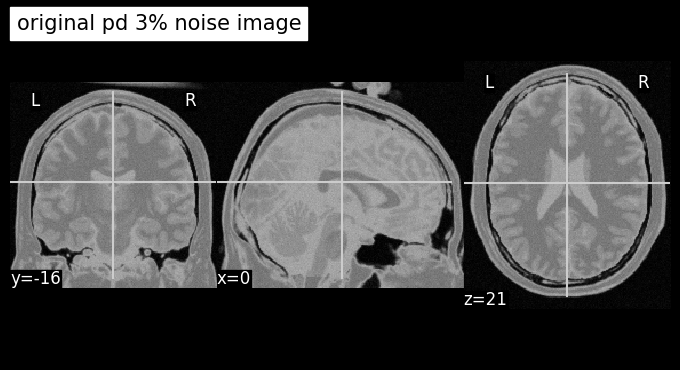

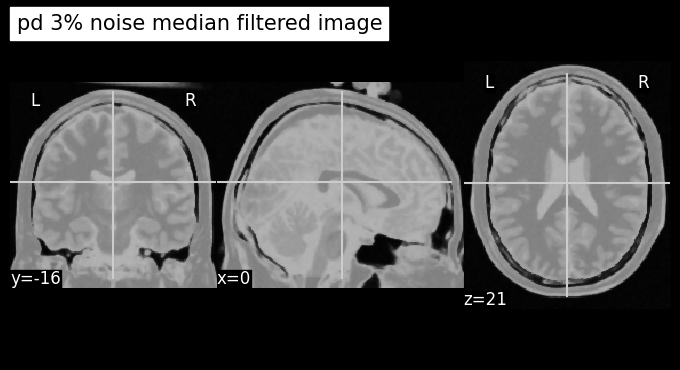

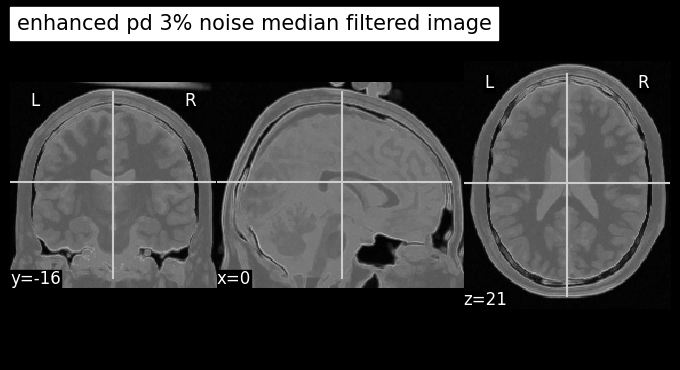

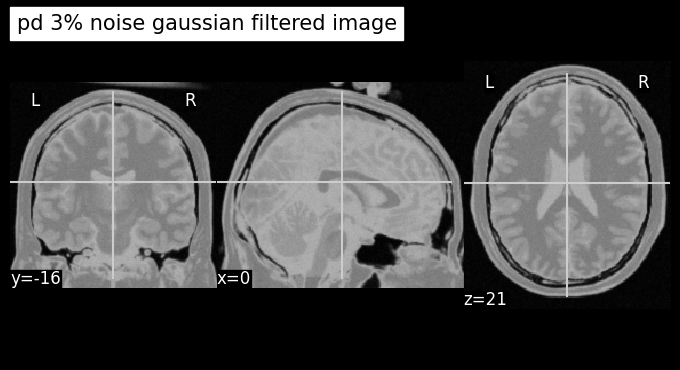

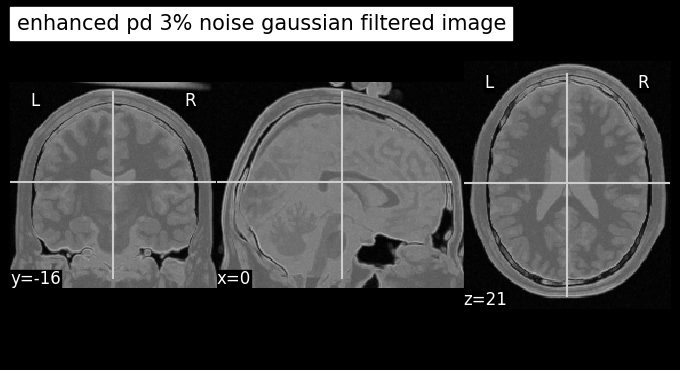

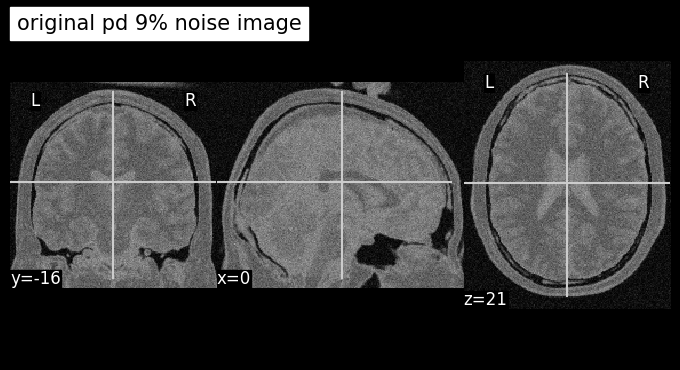

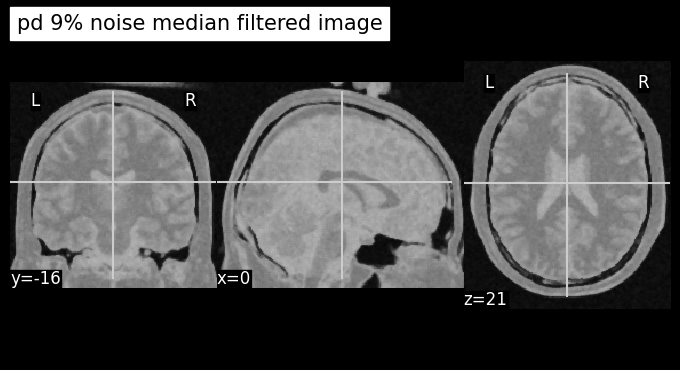

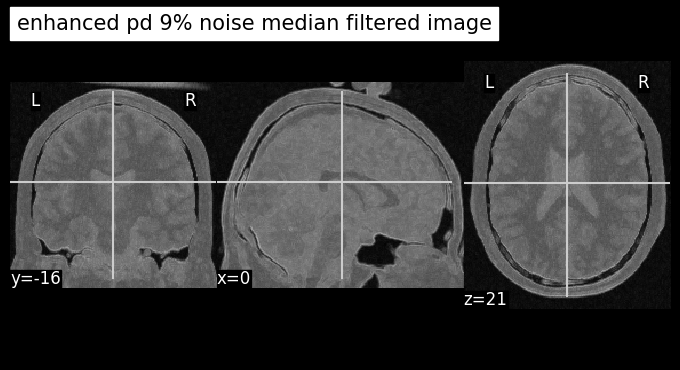

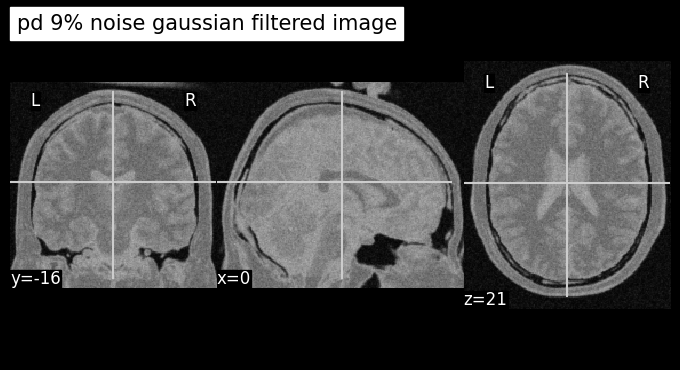

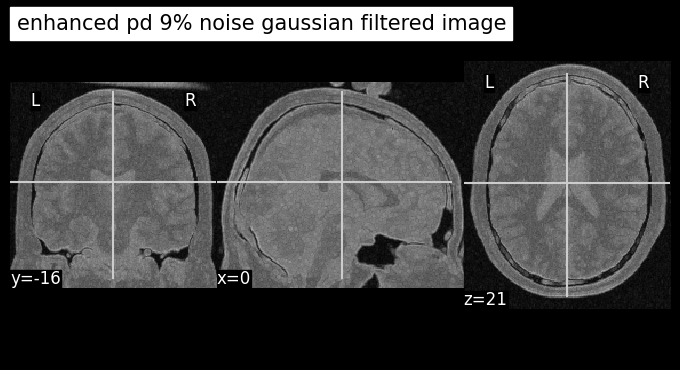

In [ ]:
# original 3% noise image pd
display = plotting.plot_anat(pd_3_noise, title="original pd 3% noise image", cut_coords=[0,-16,21])

# median denoised image 3%
display = plotting.plot_anat(pd_3_noise_median_nii, title="pd 3% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median image
enhanced_pd_3_img_median_nii = nib.Nifti1Image(enhanced_pd_3_img_median, pd_3_affine)
display = plotting.plot_anat(enhanced_pd_3_img_median_nii, title="enhanced pd 3% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 3%
display = plotting.plot_anat(pd_3_noise_gaussian_nii, title="pd 3% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_pd_3_img_gaussian_nii = nib.Nifti1Image(enhanced_pd_3_img_gaussian, pd_3_affine)
display = plotting.plot_anat(enhanced_pd_3_img_gaussian_nii, title="enhanced pd 3% noise gaussian filtered image", cut_coords=[0,-16,21])

# original 9% noise image
display = plotting.plot_anat(pd_9_noise, title="original pd 9% noise image", cut_coords=[0,-16,21])

# median denoised image 9%
display = plotting.plot_anat(pd_9_noise_median_nii, title="pd 9% noise median filtered image",cut_coords=[0,-16,21] )
# enhanced median images
enhanced_pd_9_img_median_nii = nib.Nifti1Image(enhanced_pd_9_img_median, pd_9_affine)
display = plotting.plot_anat(enhanced_pd_9_img_median_nii, title="enhanced pd 9% noise median filtered image", cut_coords=[0,-16,21])

# gaussian denoised image 9%
display = plotting.plot_anat(pd_9_noise_gaussian_nii, title="pd 9% noise gaussian filtered image",cut_coords=[0,-16,21] )
# enhanced gaussian image
enhanced_pd_9_img_gaussian_nii = nib.Nifti1Image(enhanced_pd_9_img_gaussian, pd_9_affine)
display = plotting.plot_anat(enhanced_pd_9_img_gaussian_nii, title="enhanced pd 9% noise gaussian filtered image", cut_coords=[0,-16,21])

**Calculating Coefficient of Variation (CV)**

This variable is the ratio between standard deviation to the mean. The higher the value of this variable indicates a greater level of dispersion around the mean.  

In [ ]:
# t1 3%

# CV, mean, standard deviation for t1 clean image
clean_mean = ndimage.mean(t1_clean_img)
clean_stdv  = ndimage.standard_deviation(t1_clean_img)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 clean image are: ', (clean_stdv/clean_mean, clean_stdv, clean_mean))

# CV, mean, standard deviation for t1 3%
t1_3_mean = ndimage.mean(t1_3_img)
t1_3_stdv = ndimage.standard_deviation(t1_3_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of t1 3% image are: ', (t1_3_stdv/t1_3_mean, t1_3_stdv, t1_3_mean))

# CV, mean, standard deviation for t1 3% gaussian filtering
t1_3_gaussian_mean = ndimage.mean(t1_3_img_gaussian)
t1_3_gaussian_stdv = ndimage.standard_deviation(t1_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with gaussian filtering are: ', (t1_3_gaussian_stdv/t1_3_gaussian_mean, t1_3_gaussian_stdv, t1_3_gaussian_mean))

# CV, mean, standard deviation for t1 3% enhanced gaussian filtering
enhanced_t1_3_gaussian_mean = ndimage.mean(enhanced_t1_3_img_gaussian)
enhanced_t1_3_gaussian_stdv = ndimage.standard_deviation(enhanced_t1_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with enhanced gaussian filtering are: ', (enhanced_t1_3_gaussian_stdv/enhanced_t1_3_gaussian_mean, enhanced_t1_3_gaussian_stdv, enhanced_t1_3_gaussian_mean))

# CV, mean, standard deviation for t1 3% median filtering
t1_3_median_mean = ndimage.mean(t1_3_img_median)
t1_3_median_stdv = ndimage.standard_deviation(t1_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with median filtering are: ', (t1_3_median_stdv/t1_3_median_mean, t1_3_median_stdv, t1_3_median_mean))

# CV, mean, standard deviation for t1 3% enhanced median filtering
enhanced_t1_3_median_mean = ndimage.mean(enhanced_t1_3_img_median)
enhanced_t1_3_median_stdv = ndimage.standard_deviation(enhanced_t1_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with enhanced median filtering are: ', (enhanced_t1_3_median_stdv/enhanced_t1_3_median_mean, enhanced_t1_3_median_stdv, enhanced_t1_3_median_mean))


# t1 9%


# CV, mean, standard deviation for t1 9%
t1_9_mean = ndimage.mean(t1_9_img)
t1_9_stdv = ndimage.standard_deviation(t1_9_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of t1 9% image are: ', (t1_9_stdv/t1_9_mean, t1_9_stdv, t1_9_mean))

# CV, mean, standard deviation for t1 9% gaussian filtering
t1_9_gaussian_mean = ndimage.mean(t1_9_img_gaussian)
t1_9_gaussian_stdv = ndimage.standard_deviation(t1_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 9% image with gaussian filtering are: ', (t1_9_gaussian_stdv/t1_9_gaussian_mean, t1_9_gaussian_stdv, t1_9_gaussian_mean))

# CV, mean, standard deviation for t1 9% enhanced gaussian filtering
enhanced_t1_9_gaussian_mean = ndimage.mean(enhanced_t1_9_img_gaussian)
enhanced_t1_9_gaussian_stdv = ndimage.standard_deviation(enhanced_t1_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 9% image with enhanced gaussian filtering are: ', (enhanced_t1_9_gaussian_stdv/enhanced_t1_9_gaussian_mean, enhanced_t1_9_gaussian_stdv, enhanced_t1_9_gaussian_mean))

# CV, mean, standard deviation for t1 9% median filtering
t1_9_median_mean = ndimage.mean(t1_9_img_median)
t1_9_median_stdv = ndimage.standard_deviation(t1_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 9% image with median filtering are: ', (t1_9_median_stdv/t1_9_median_mean, t1_9_median_stdv, t1_9_median_mean))

# CV, mean, standard deviation for t1 3% enhanced median filtering
enhanced_t1_9_median_mean = ndimage.mean(enhanced_t1_9_img_median)
enhanced_t1_9_median_stdv = ndimage.standard_deviation(enhanced_t1_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t1 9% image with enhanced median filtering are: ', (enhanced_t1_9_median_stdv/enhanced_t1_9_median_mean, enhanced_t1_9_median_stdv, enhanced_t1_9_median_mean))


# t2 3%


# CV, mean, standard deviation for t2 clean image
clean_mean = ndimage.mean(t2_clean_img)
clean_stdv  = ndimage.standard_deviation(t2_clean_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of t2 clean image are: ', (clean_stdv/clean_mean, clean_stdv, clean_mean))

# CV, mean, standard deviation for t2 3%
t2_3_mean = ndimage.mean(t2_3_img)
t2_3_stdv = ndimage.standard_deviation(t2_3_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of t2 3% image are: ', (t2_3_stdv/t2_3_mean, t2_3_stdv, t2_3_mean))

# CV, mean, standard deviation for t2 3% gaussian filtering
t2_3_gaussian_mean = ndimage.mean(t2_3_img_gaussian)
t2_3_gaussian_stdv = ndimage.standard_deviation(t2_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 3% image with gaussian filtering are: ', (t2_3_gaussian_stdv/t2_3_gaussian_mean, t2_3_gaussian_stdv, t2_3_gaussian_mean))

# CV, mean, standard deviation for t2 3% enhanced gaussian filtering
enhanced_t2_3_gaussian_mean = ndimage.mean(enhanced_t2_3_img_gaussian)
enhanced_t2_3_gaussian_stdv = ndimage.standard_deviation(enhanced_t2_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 3% image with enhanced gaussian filtering are: ', (enhanced_t2_3_gaussian_stdv/enhanced_t2_3_gaussian_mean, enhanced_t2_3_gaussian_stdv, enhanced_t2_3_gaussian_mean))

# CV, mean, standard deviation for t2 3% median filtering
t2_3_median_mean = ndimage.mean(t2_3_img_median)
t2_3_median_stdv = ndimage.standard_deviation(t2_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 3% image with median filtering are: ', (t2_3_median_stdv/t2_3_median_mean, t2_3_median_stdv, t2_3_median_mean))

# CV, mean, standard deviation for t2 3% enhanced median filtering
enhanced_t2_3_median_mean = ndimage.mean(enhanced_t2_3_img_median)
enhanced_t2_3_median_stdv = ndimage.standard_deviation(enhanced_t2_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 3% image with enhanced median filtering are: ', (enhanced_t2_3_median_stdv/enhanced_t2_3_median_mean, enhanced_t2_3_median_stdv, enhanced_t2_3_median_mean))


# t2 9%


# CV, mean, standard deviation for t2 9%
t2_9_mean = ndimage.mean(t2_9_img)
t2_9_stdv = ndimage.standard_deviation(t2_9_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of t2 9% image are: ', (t2_9_stdv/t2_9_mean, t2_9_stdv, t2_9_mean))

# CV, mean, standard deviation for t2 9% gaussian filtering
t2_9_gaussian_mean = ndimage.mean(t2_9_img_gaussian)
t2_9_gaussian_stdv = ndimage.standard_deviation(t2_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 9% image with gaussian filtering are: ', (t2_9_gaussian_stdv/t2_9_gaussian_mean, t2_9_gaussian_stdv, t2_9_gaussian_mean))

# CV, mean, standard deviation for t2 9% enhanced gaussian filtering
enhanced_t2_9_gaussian_mean = ndimage.mean(enhanced_t2_9_img_gaussian)
enhanced_t2_9_gaussian_stdv = ndimage.standard_deviation(enhanced_t2_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 9% image with enhanced gaussian filtering are: ', (enhanced_t2_9_gaussian_stdv/enhanced_t2_9_gaussian_mean, enhanced_t2_9_gaussian_stdv, enhanced_t2_9_gaussian_mean))

# CV, mean, standard deviation for t2 9% median filtering
t2_9_median_mean = ndimage.mean(t2_9_img_median)
t2_9_median_stdv = ndimage.standard_deviation(t2_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 9% image with median filtering are: ', (t2_9_median_stdv/t2_9_median_mean, t2_9_median_stdv, t2_9_median_mean))

# CV, mean, standard deviation for t2 3% enhanced median filtering
enhanced_t2_9_median_mean = ndimage.mean(enhanced_t2_9_img_median)
enhanced_t2_9_median_stdv = ndimage.standard_deviation(enhanced_t2_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of t2 9% image with enhanced median filtering are: ', (enhanced_t2_9_median_stdv/enhanced_t2_9_median_mean, enhanced_t2_9_median_stdv, enhanced_t2_9_median_mean))


# pd 3%


# CV, mean, standard deviation for pdd clean image
clean_mean = ndimage.mean(pd_clean_img)
clean_stdv  = ndimage.standard_deviation(pd_clean_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of pd clean image are: ', (clean_stdv/clean_mean, clean_stdv, clean_mean))

# CV, mean, standard deviation for pd 3%
pd_3_mean = ndimage.mean(pd_3_img)
pd_3_stdv = ndimage.standard_deviation(pd_3_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of pd 3% image are: ', (pd_3_stdv/pd_3_mean, pd_3_stdv, pd_3_mean))

# CV, mean, standard deviation for pd 3% gaussian filtering
pd_3_gaussian_mean = ndimage.mean(pd_3_img_gaussian)
pd_3_gaussian_stdv = ndimage.standard_deviation(pd_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 3% image with gaussian filtering are: ', (pd_3_gaussian_stdv/pd_3_gaussian_mean, pd_3_gaussian_stdv, pd_3_gaussian_mean))

# CV, mean, standard deviation for pd 3% enhanced gaussian filtering
enhanced_pd_3_gaussian_mean = ndimage.mean(enhanced_pd_3_img_gaussian)
enhanced_pd_3_gaussian_stdv = ndimage.standard_deviation(enhanced_pd_3_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 3% image with enhanced gaussian filtering are: ', (enhanced_pd_3_gaussian_stdv/enhanced_pd_3_gaussian_mean, enhanced_pd_3_gaussian_stdv, enhanced_pd_3_gaussian_mean))

# CV, mean, standard deviation for pd 3% median filtering
pd_3_median_mean = ndimage.mean(pd_3_img_median)
pd_3_median_stdv = ndimage.standard_deviation(pd_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 3% image with median filtering are: ', (pd_3_median_stdv/pd_3_median_mean, pd_3_median_stdv, pd_3_median_mean))

# CV, mean, standard deviation for pd 3% enhanced median filtering
enhanced_pd_3_median_mean = ndimage.mean(enhanced_pd_3_img_median)
enhanced_pd_3_median_stdv = ndimage.standard_deviation(enhanced_pd_3_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 3% image with enhanced median filtering are: ', (enhanced_pd_3_median_stdv/enhanced_pd_3_median_mean, enhanced_pd_3_median_stdv, enhanced_pd_3_median_mean))


# pd 9%


# CV, mean, standard deviation for pd 9%
pd_9_mean = ndimage.mean(pd_9_img)
pd_9_stdv = ndimage.standard_deviation(pd_9_img)
print('\n\nCoefficient of Variation, Standard Deviation, and Mean of pd 9% image are: ', (pd_9_stdv/pd_9_mean, pd_9_stdv, pd_9_mean))

# CV, mean, standard deviation for t2 9% gaussian filtering
pd_9_gaussian_mean = ndimage.mean(pd_9_img_gaussian)
pd_9_gaussian_stdv = ndimage.standard_deviation(pd_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 9% image with gaussian filtering are: ', (pd_9_gaussian_stdv/pd_9_gaussian_mean, pd_9_gaussian_stdv, pd_9_gaussian_mean))

# CV, mean, standard deviation for pd 9% enhanced gaussian filtering
enhanced_pd_9_gaussian_mean = ndimage.mean(enhanced_pd_9_img_gaussian)
enhanced_pd_9_gaussian_stdv = ndimage.standard_deviation(enhanced_pd_9_img_gaussian)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 9% image with enhanced gaussian filtering are: ', (enhanced_pd_9_gaussian_stdv/enhanced_pd_9_gaussian_mean, enhanced_pd_9_gaussian_stdv, enhanced_pd_9_gaussian_mean))

# CV, mean, standard deviation for pd 9% median filtering
pd_9_median_mean = ndimage.mean(pd_9_img_median)
pd_9_median_stdv = ndimage.standard_deviation(pd_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 9% image with median filtering are: ', (pd_9_median_stdv/pd_9_median_mean, pd_9_median_stdv, pd_9_median_mean))

# CV, mean, standard deviation for pd 3% enhanced median filtering
enhanced_pd_9_median_mean = ndimage.mean(enhanced_pd_9_img_median)
enhanced_pd_9_median_stdv = ndimage.standard_deviation(enhanced_pd_9_img_median)
print('Coefficient of Variation, Standard Deviation, and Mean of pd 9% image with enhanced median filtering are: ', (enhanced_pd_9_median_stdv/enhanced_pd_9_median_mean, enhanced_pd_9_median_stdv, enhanced_pd_9_median_mean))



Coefficient of Variation, Standard Deviation, and Mean of t1 clean image are:  (1.0685633712576121, 279.7883450513967, 261.83598706187036)


Coefficient of Variation, Standard Deviation, and Mean of t1 3% image are:  (0.9977056533601403, 271.4658410453993, 272.0901100751894)
Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with gaussian filtering are:  (0.9849101813779583, 267.98431966530325, 272.0901100751892)
Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with enhanced gaussian filtering are:  (0.930874623295244, 303.36745924743263, 325.89507937548973)
Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with median filtering are:  (0.986366023259938, 267.1511181539275, 270.84379617111455)
Coefficient of Variation, Standard Deviation, and Mean of t1 3% image with enhanced median filtering are:  (0.9314846201239292, 302.4053319788439, 324.64876547141535)


Coefficient of Variation, Standard Deviation, and Mean of t1 9% image

**Results analysis**

Median and Gaussian filters reduced noise according to historgram and looking at images. Both filters also show this in their CV values. For each image and noise level, the filters by themselves had lower values compared to the noisy images. Furthermore, the enhanced images had even lower values than the regular filters indicating that the enhanced filters acheived more precise image restoration.

A lower CV indicates more precise image restoration meaning our smoothing was a success! More specific details are found in the report.